# Data_Exploration_and_BERTopic

This notebook does data exploration, runs BERTopic on the first essay question and extracts a topic probability matrix where each vector shows how probable the user profile text fits into a topic

# Set Up

In [11]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [12]:
root_path = "/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien"

In [5]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
!pip install bertopic

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 58 kB 4.7 MB/s 
     |████████████████████████████████| 88 kB 6.5 MB/s 
     |████████████████████████████████| 79 kB 9.1 MB/s 
     |████████████████████████████████| 5.2 MB 61.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 4.2 MB 53.6 MB/s 
     |████████████████████████████████| 1.2 MB 50.7 MB/s 
     |████████████████████████████████| 86 kB 6.4 MB/s 
     |████████████████████████████████| 6.6 MB 44.8 MB/s 
     |████████████████████████████████| 636 kB 66.0 MB/s 
     |████████████████████████████████| 1.1 MB 58.3 MB/s 
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp37-cp37m-linux_x86_64.whl size=2342107 sha256=2aa82b21fc69e5ca1b1fbc984e90cbd0fea2870071ad61e6cbb2307e2b1330ef
  Stored in directory: /root/.cache/p

In [7]:
import pandas as pd
import torch
import numpy as np
from sklearn.model_selection import train_test_split
from torch import nn
import matplotlib as plt
import nltk
nltk.download('stopwords')
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


ModuleNotFoundError: ignored

## Import raw dataset

In [13]:
raw_data = pd.read_csv("/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien/data/raw/okcupid_profiles.csv")

In [14]:
raw_data

,age,status,sex,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,about me: i would love to think that i was so...,currently working as an international agent fo...,making people laugh. ranting about a good salt...,"the way i look. i am a six foot half asian, ha...","books: absurdistan, the republic, of mice and ...",food. water. cell phone. shelter.,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet! you are ti...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,i am a chef: this is what that means. 1. i am ...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories. my b...,NaN,NaN,i am very open and will share just about anyth...,NaN
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,i work in a library and go to school. . .,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,"bataille, celine, beckett. . . lynch, jarmusch...",NaN,cats and german philosophy,NaN,NaN,you feel so inclined.
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,hey how's it going? currently vague on the pro...,work work work work + play,creating imagery to look at: http://bagsbrown....,i smile a lot and my inquisitive nature,"music: bands, rappers, musicians at the moment...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59941,59,single,f,straight,NaN,NaN,socially,never,graduated from college/university,NaN,...,"vibrant, expressive, caring optimist. i love b...",the happiest times have been when life came to...,i make an outstanding osso bucco. i am also ve...,"i am told that people notice my smile, eyes an...",i am an avid movie watcher and follow the broa...,"my family, my dog, italy, words and music!",writing my book.,"running with my dog, finishing up the work wee...",i have a dream to sing at the alconquin in nyc...,you are seeking a long term connection of shar...
59942,24,single,m,straight,fit,mostly anything,often,sometimes,working on college/university,"white, other",...,i'm nick. i never know what to write about mys...,currently finishing school for film production...,"filmmaking, photography, graphic design, web d...","dude, i don't know.","movies: hook (the greatest adventure ever!), g...",iphone contact lenses headphones camera tv rem...,i do most of my thinking on the bus to/from wo...,"bringin' home bacon, or drinking and shakin'!",when i was 18 i got a tattoo of waldo somewher...,meh if you made it this far you might as well.
59943,42,single,m,straight,average,mostly anything,not at all,never,graduated from masters program,asian,...,"hello! i enjoy traveling, watching movies, and...","i'm a civil engineer, who enjoys helping the c...",- looking at things objectively - getting thin...,i'm quiet until i get used to the environment ...,"last book: ""game change"". movies

In [ ]:
#Extract essay 0 (about me) to a list
df = raw_data[raw_data.essay0.notnull()]
docs = list(df["essay0"]) #Make dataset to list

In [ ]:
#Extract essay 1 (my goals) to a list 
df_goals = raw_data[raw_data.essay1.notnull()]
docs_goals = list(df["essay1"])

# Explore Dataset

In [ ]:
df.head()

,age,status,sex,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,about me: i would love to think that i was so...,currently working as an international agent fo...,making people laugh. ranting about a good salt...,"the way i look. i am a six foot half asian, ha...","books: absurdistan, the republic, of mice and ...",food. water. cell phone. shelter.,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet! you are ti...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,i am a chef: this is what that means. 1. i am ...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories. my b...,NaN,NaN,i am very open and will share just about anyth...,NaN
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,i work in a library and go to school. . .,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,"bataille, celine, beckett. . . lynch, jarmusch...",NaN,cats and german philosophy,NaN,NaN,you feel so inclined.
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,hey how's it going? currently vague on the pro...,work work work work + play,creating imagery to look at: http://bagsbrown....,i smile a lot and my inquisitive nature,"music: bands, rappers, musicians at the moment...",NaN,NaN,NaN,NaN,NaN


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
df.groupby(by=["sex"]).count()


,age,status,orientation,body_type,diet,drinks,drugs,education,ethnicity,height,...,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9
sex,,,,,,,,,,,,,,,,,,,,,
f,21810,21810,21810,19440,12874,20901,16824,19800,19725,21810,...,21810,19932,19299,18991,19038,19262,17682,18301,15577,17965
m,32648,32648,32648,30304,19553,31119,24686,29084,29869,32647,...,32648,30278,29015,27532,28359,27579,26747,27226,23853,27671


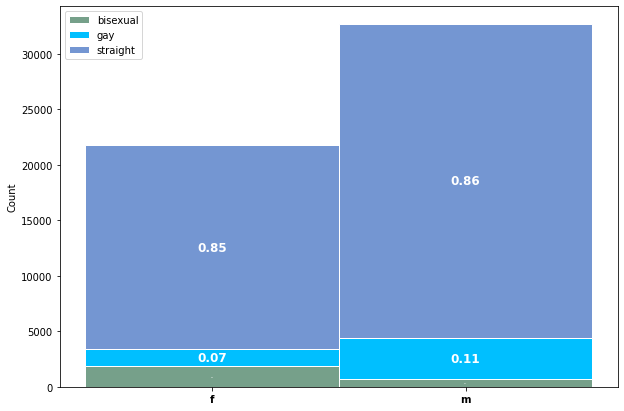

In [ ]:
pclass_xt_group = df.groupby(by=["sex", "orientation"]).count()
pclass_xt_group = pclass_xt_group.T
#display(pclass_xt_group)

#Get values from the group and categories
groups = ['f', 'm']
female = pclass_xt_group['f'].to_numpy()[0]
male = pclass_xt_group['m'].to_numpy()[0]

bisexual = [pclass_xt_group['f']['bisexual'][0], pclass_xt_group['m']['bisexual'][0]]
gay = [pclass_xt_group['f']['gay'][0], pclass_xt_group['m']['gay'][0]]
straight = [pclass_xt_group['f']['straight'][0], pclass_xt_group['m']['straight'][0]]

#add colors
colors = ['#76A08A', '#00BFFF','#7496D2']

# The position of the bars on the x-axis
r = range(len(groups))
barWidth = 1

#plot bars
plt.figure(figsize=(10,7))
ax1 = plt.bar(r, bisexual, color=colors[0], edgecolor='white', width=barWidth, label="bisexual")
ax2 = plt.bar(r, gay, bottom=np.array(bisexual), color=colors[1], edgecolor='white', width=barWidth, label='gay')
ax3 = plt.bar(r, straight, bottom=np.array(bisexual)+np.array(gay), color=colors[2], edgecolor='white', width=barWidth, label='straight')
plt.legend()

# Custom X axis
plt.xticks(r, groups, fontweight='bold')
plt.ylabel("Count")

for r1, r2, r3 in zip(ax1, ax2, ax3):
    h1 = r1.get_height()
    h2 = r2.get_height()
    h3 = r3.get_height()
    plt.text(r1.get_x() + r1.get_width() / 2., h1 / 2., "%.2f" % (h1/(h1+h2+h3)), ha="center", va="center", color="white", fontsize=1, fontweight="bold")
    plt.text(r2.get_x() + r2.get_width() / 2., h1 + h2 / 2., "%.2f" % (h2/(h1+h2+h3)), ha="center", va="center", color="white", fontsize=12, fontweight="bold")
    plt.text(r3.get_x() + r3.get_width() / 2., h1 + h2 + h3 / 2., "%.2f" % (h3/(h1+h2+h3)), ha="center", va="center", color="white", fontsize=12, fontweight="bold")
plt.show()

In [ ]:
#Plot for age distribution

In [ ]:
df["essay0"]

0        about me:  i would love to think that i was so...
1        i am a chef: this is what that means. 1. i am ...
2        i'm not ashamed of much, but writing public te...
3                i work in a library and go to school. . .
4        hey how's it going? currently vague on the pro...
                               ...                        
59941    vibrant, expressive, caring optimist. i love b...
59942    i'm nick. i never know what to write about mys...
59943    hello! i enjoy traveling, watching movies, and...
59944    "all i have in this world are my balls and my ...
59945    is it odd that having a little "enemy" status ...
Name: essay0, Length: 54458, dtype: object

Make a Wordcloud

In [ ]:
from wordcloud import WordCloud

In [ ]:
essay_0_lst = list(df["essay0"])

In [ ]:
#lowercase all essay 0 strings
essay_0_lst = (map(lambda x: x.lower(), df["essay0"]))

In [ ]:
essay_0_lst = list(essay_0_lst)

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))

def remove_stopwords(data):
    output_array=[]
    for sentence in data:
        temp_list=[]
        for word in sentence.split():
            if word.lower() not in stopwords:
                temp_list.append(word)
        output_array.append(' '.join(temp_list))
    return output_array

In [ ]:
essay_0_lst_stop = remove_stopwords(essay_0_lst)

In [ ]:
essay_0_stop_df = pd.DataFrame({"essay_0": essay_0_lst_stop
    
})

In [ ]:
essay_0_stop_df.head()

,essay_0
0,me: would love think kind intellectual: either...
1,chef: means. 1. workaholic. 2. love cook regar...
2,"i'm ashamed much, writing public text online d..."
3,work library go school. . .
4,"hey how's going? currently vague profile know,..."


In [ ]:
wordcloud2 = WordCloud().generate(' '.join(essay_0_stop_df["essay_0"]))

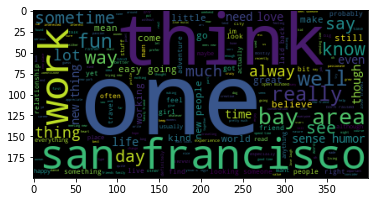

In [ ]:
plt.imshow(wordcloud2)

(-0.5, 2999.5, 1999.5, -0.5)

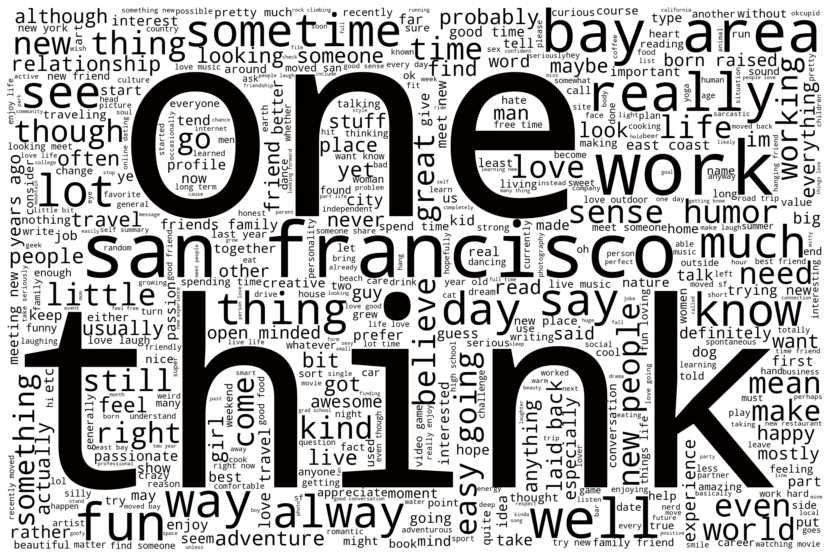

In [ ]:
# change the value to black
def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")
# set the wordcloud background color to white
# set max_words to 1000
# set width and height to higher quality, 3000 x 2000
wordcloud = WordCloud(background_color="white", width=3000, height=2000, max_words=500).generate((' '.join(essay_0_stop_df["essay_0"])))
# set the word color to black
wordcloud.recolor(color_func = black_color_func)
# set the figsize
plt.figure(figsize=[15,10])
# plot the wordcloud
plt.imshow(wordcloud, interpolation="bilinear")
# remove plot axes
plt.axis("off")

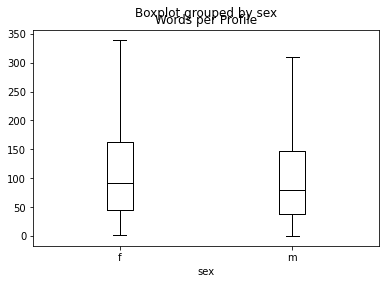

In [ ]:
#How long are the profile texts?
df["Words per Profile"] = df["essay0"].str.split().apply(len)
df.boxplot("Words per Profile", by="sex", grid=False, showfliers=False,
           color="black")

#Very similar lengths from 16-60 words per profile text, but distribution of women a little higher, also higher median 

# Create Topic Probabilities

In [ ]:
#to make it reproducible results: include randomstate 
from umap import UMAP

umap_model = UMAP(n_neighbors=15, n_components=5, 
                  min_dist=0.0, metric='cosine', random_state=42)

In [ ]:
# we add this to remove stopwords
vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words="english")

In [ ]:
# create model 
sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
topic_model = BERTopic(embedding_model=sentence_model, 
                       calculate_probabilities=True, 
                       vectorizer_model=vectorizer_model, #this should remove stopwords
                       verbose=True, 
                       #nr_topics="auto",
                       umap_model = umap_model 
                       )

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [ ]:
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/1702 [00:00<?, ?it/s]

2022-06-13 12:46:30,447 - BERTopic - Transformed documents to Embeddings
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
2022-06-13 12:48:15,465 - BERTopic - Reduced dimensionality
2022-06-13 12:51:31,745 - BERTopic - Clustered reduced embeddings


In [ ]:
df_probs = pd.DataFrame(probs)

In [ ]:
df_probs #221 topics

,0,1,2,3,4,5,6,7,8,9,...,211,212,213,214,215,216,217,218,219,220
0,0.002723,0.003114,0.004054,0.003113,0.003429,0.001658,0.003181,0.028741,0.004754,0.004299,...,0.002250,0.005601,0.020259,0.006792,0.008299,0.001839,0.002414,0.004358,0.001816,0.003019
1,0.003634,0.004836,0.002377,0.002720,0.002405,0.001806,0.003236,0.004251,0.002086,0.003219,...,0.002743,0.004987,0.003908,0.006535,0.004267,0.002147,0.003732,0.006681,0.002048,0.001860
2,0.001947,0.001848,0.004683,0.023707,0.001906,0.001426,0.004204,0.002511,0.001868,0.002342,...,0.002185,0.002053,0.002956,0.002095,0.002076,0.001498,0.002036,0.002298,0.001411,0.003668
3,0.002901,0.010673,0.001937,0.002085,0.003025,0.002030,0.002581,0.003438,0.002310,0.003323,...,0.002380,0.004996,0.002948,0.006239,0.005202,0.002408,0.003250,0.004249,0.002487,0.001735
4,0.002925,0.004573,0.003833,0.006909,0.004520,0.002327,0.015991,0.003879,0.003368,0.005971,...,0.003286,0.003479,0.004050,0.003711,0.003954,0.002586,0.003743,0.005218,0.002489,0.004206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54453,0.002122,0.004373,0.002595,0.002636,0.012166,0.001562,0.004043,0.003976,0.003584,0.024821,...,0.001926,0.003144,0.003756,0.003466,0.004381,0.001758,0.002000,0.006246,0.001744,0.002239
54454,0.000513,0.000689,0.000387,0.000481,0.000417,0.000392,0.000606,0.000472,0.000338,0.000486,...,0.000556,0.000656,0.000450,0.000579,0.000568,0.000479,0.000871,0.000581,0.000473,0.000341
54455,0.004633,0.001509,0.000972,0.001009,0.000783,0.001082,0.000997,0.001727,0.000750,0.000924,...,0.001713,0.001598,0.001329,0.002109,0.001344,0.001312,0.002848,0.001314,0.001202,0.000715
54456,0.000947,0.001443,0.001175,0.000968,0.001836,0.000621,0.001122,0.003279,0.002168,0.001926,...,0.000781,0.002364,0.002449,0.002343,0.003690,0.000695,0.000908,0.001957,0.000698,0.000984


In [ ]:
#df_probs["sum_probabilities"] = df_probs. sum(axis=1)
#df_probs.loc[df_probs["sum_probabilities"]<0.5]

In [ ]:
probs.shape #221 topics for 54458 users

(54458, 221)

In [ ]:
topic_info = topic_model.get_topic_info()

In [ ]:
topic_info["Name"]

0                               -1_love_like_life_people
1                                    0_city_ve_years_bay
2                           1_sports_outdoors_like_going
3                            2_queer_gay_gender_bisexual
4                     3_dating_online_online dating_meet
                             ...                        
214    216_california_youthful years_california demea...
213                        217_sarcastic_fan_huge_giants
211    219_architecture_firm_design firm_architecture...
210               215_hippie_hippie heart_admire_hippies
221                          220_uh uh_cupid_uh_ok cupid
Name: Name, Length: 222, dtype: object

In [ ]:
topic_info["Topic"]

0       -1
1        0
2        1
3        2
4        3
      ... 
214    216
213    217
211    219
210    215
221    220
Name: Topic, Length: 222, dtype: int64

In [ ]:
df_topics = pd.DataFrame({"Profile_text": docs,"Topic": topics, "Sex": df.sex})

In [ ]:
df_topics= pd.merge(left = topic_info, right = df_topics, on = "Topic")

In [ ]:
df_topics

,Topic,Count,Name,Profile_text,Sex
0,-1,42238,-1_love_like_life_people,about me: i would love to think that i was so...,m
1,-1,42238,-1_love_like_life_people,i am a chef: this is what that means. 1. i am ...,m
2,-1,42238,-1_love_like_life_people,i work in a library and go to school. . .,m
3,-1,42238,-1_love_like_life_people,hey how's it going? currently vague on the pro...,m
4,-1,42238,-1_love_like_life_people,"i'm an australian living in san francisco, but...",m
...,...,...,...,...,...
54453,220,10,220_uh uh_cupid_uh_ok cupid,cupid schmupid,m
54454,220,10,220_uh uh_cupid_uh_ok cupid,just seeing what ok cupid is all about,m
54455,220,10,220_uh uh_cupid_uh_ok cupid,new to the city and this... just trying it out...,f
54456,220,10,220_uh uh_cupid_uh_ok cupid,"i took a hiatus from the cupid, now i'm back.",f


In [ ]:
#save in processed data 
path = '/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien/data/processed/df_topics.csv'

with open(path, 'w', encoding = 'utf-8-sig') as f:
  df_topics.to_csv(f)

In [ ]:
path = '/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien/data/processed/df_probs.csv'

with open(path, 'w', encoding = 'utf-8-sig') as f:
  df_probs.to_csv(f)

In [ ]:
sex = list(df["sex"])

# Explore Topics and Visualize

In [ ]:
topic_model.get_topic_info() #-1 topic is the most frequent one, it usually contains stopwords, but we removed them before, so it shows
#the most generic topic: love_like_life_people

,Topic,Count,Name
0,-1,42238,-1_love_like_life_people
1,0,2126,0_san_moved_city_francisco
2,1,624,1_looking_woman_relationship_life
3,2,594,2_like_enjoy_love_going
4,3,480,3_queer_gay_gender_bisexual
...,...,...,...
169,168,10,168_sarcastic_fan_huge_giants
170,169,10,169_uh uh_cupid_uh_ok cupid
171,170,10,170_wolves_setters_english setters_goat
172,171,10,171_opera singer_singer_opera_creative person


In [ ]:
topic_model.visualize_topics()

In [ ]:
topic_model.visualize_barchart()

In [ ]:
topic_model.visualize_distribution(probs[0])

In [ ]:
topics_per_class = topic_model.topics_per_class(docs, topics, classes=sex)
topic_model.visualize_topics_per_class(topics_per_class, top_n_topics=50, width=900)

2it [00:12,  6.18s/it]


In [ ]:
topics_per_class 

,Topic,Words,Frequency,Class,Name
0,-1,"love, like, life, people, new",16390,f,-1_love_like_life_people
1,0,"city, years, new, love, bay",251,f,0_city_years_ve_new
2,1,"loving, adventurous, passionate, loyal, creative",226,f,1_loving_adventurous_loyal_passionate
3,2,"loyal, person, honest, funny, outgoing",258,f,2_loyal_funny_honest_person
4,3,"queer, gender, gay, femme, bisexual",250,f,3_queer_gay_gender_bisexual
...,...,...,...,...,...
451,223,"hippie, admire, hippie heart, hippies, mind piece",4,m,223_hippie_hippie heart_admire_hippies
452,224,"area, bay area, bay, zillions texts, activity ...",7,m,224_bay area_area_bay_meet
453,225,"engineer, geek, seeking intellectual, outgoing...",8,m,225_geek_engineer_science lover_ish guys
454,226,"roofing, goes company, life moved, france comp...",7,m,226_roofing_goes company_uc_life moved


# Tweak Topic Modeling 

In [ ]:
#Reduce Topics to only 50
new_topics, new_probs = topic_model.reduce_topics(docs, topics, nr_topics=100)

In [ ]:
#Reduce Topics to only 100
new_topics_100, new_probs_100 = topic_model.reduce_topics(docs, topics, nr_topics=100)

2022-06-12 13:19:55,772 - BERTopic - Reduced number of topics from 229 to 101


In [ ]:
topic_model.update_topics(docs, topics, n_gram_range=(1, 3))

In [ ]:
topics_per_class_50 = topic_model.topics_per_class(docs, new_topics, classes=sex)
topic_model.visualize_topics_per_class(topics_per_class, top_n_topics=50, width=900)

2it [00:12,  6.06s/it]


In [ ]:
topics_per_class_50

,Topic,Words,Frequency,Class
0,-1,"love, like, life, people, new",17663,f
1,0,"love, new, bay, years, like",343,f
2,1,"loving, passionate, adventurous, creative, loyal",229,f
3,2,"good, person, love, loyal, fun",263,f
4,3,"dating, online, online dating, meet, people",211,f
...,...,...,...,...
97,45,"oakland, moved oakland, living oakland, moved,...",42,m
98,46,"nice, nice guy, guy, guy looking, simple",54,m
99,47,"asian, chinese, asian guy, guy, looking",45,m
100,48,"ve come, come, let, kiss, ve",50,m


In [ ]:
topics_per_class_100 = topic_model.topics_per_class(docs, new_topics_100, classes=sex)

2it [00:43, 21.63s/it]


In [ ]:
topics_per_class_100

,Topic,Words,Frequency,Class
0,-1,"and, to, the, in, my",17023,f
1,0,"the, to, in, and, my",300,f
2,1,"and, am, to, good, person",266,f
3,2,"loving, passionate, and, adventurous, creative",226,f
4,3,"queer, and, am, to, that",250,f
...,...,...,...,...
197,95,"bay, the bay, bay area, area, the bay area",18,m
198,96,"drama, drama free, easy, free, hate drama",16,m
199,97,"travel, to travel, different, love to travel, and",13,m
200,98,"moved, moved to, moved to san, to san, san",26,m


In [ ]:
df_topics_50 = pd.DataFrame({"Profile_text": docs,"most_probable_topic": new_topics, "Sex": df.sex})

In [ ]:
df_topics_100 = pd.DataFrame({"Profile_text": docs,"most_probable_topic": new_topics_100, "Sex": df.sex})

In [ ]:
path = '/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien/data/processed/df_topics_50.csv'

with open(path, 'w', encoding = 'utf-8-sig') as f:
  df_topics_50.to_csv(f)

In [ ]:
path = '/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien/data/processed/df_topics_100.csv'

with open(path, 'w', encoding = 'utf-8-sig') as f:
  df_topics_100.to_csv(f)

# Extract topics as feature

I extract for each document (profile text) the probabilities for all topics (we have 370 topics in total)
So: We need to

In [ ]:
len(probs)

52374

In [ ]:
profile_text_0_prob = probs[0][0:] #[row][column] -> shows probabilities for all topics for profile text 0
print(profile_text_0_prob.transpose)

<built-in method transpose of numpy.ndarray object at 0x000001C188AEE810>


In [ ]:
# save probabilities for now
#np.savetxt('probs_BERTopic_model.csv', probs, delimiter=",")
#np.savetxt("C:/Users/norap/Documents/GitHub/Machine Learning NLP TU Wien/data/processed/probs_BERTopic_model.csv", probs, delimiter=",")

In [ ]:
probs[0:10] #row = profile_text, column = topic

array([[3.37330169e-03, 2.12716907e-03, 2.61524576e-03, ...,
        1.56655282e-03, 2.54651947e-03, 3.25209197e-03],
       [5.08097615e-04, 6.35537333e-04, 6.91284345e-04, ...,
        2.20704010e-03, 8.08335599e-04, 7.65618872e-04],
       [1.79105837e-03, 5.83744074e-03, 4.03454143e-03, ...,
        1.60454403e-03, 3.38802677e-03, 5.62267446e-03],
       ...,
       [1.90899961e-03, 3.54951797e-03, 4.19625636e-03, ...,
        1.94765329e-03, 4.93507129e-03, 6.84068645e-03],
       [1.22500631e-04, 1.29004654e-04, 1.41476661e-04, ...,
        2.17915937e-04, 2.57977999e-04, 2.40082696e-04],
       [1.79048527e-05, 1.33717758e-05, 1.27033729e-05, ...,
        5.65994313e-06, 9.83580777e-06, 1.55203815e-05]])

In [ ]:
# Extract frequencies
df_topic_sex = pd.DataFrame({"Profile_text": essay_1_lst_stop,"most_probable_topic": topics, "Sex": df.sex})

In [ ]:
#len(frequencies)
len(probs)
df_probs = pd.DataFrame(probs)
len(df_probs)

52374

In [ ]:
df_topic_sex

,Profile_text,most_probable_topic,Sex
0,currently working international agent freight ...,-1,m
1,dedicating everyday unbelievable badass.,87,m
2,"make nerdy software musicians, artists, experi...",-1,m
3,reading things written old dead people,2,m
4,work work work work + play,77,m
...,...,...,...
59941,happiest times life came ran it-not ahead it. ...,-1,f
59942,"currently finishing school film production, em...",20,m
59943,"i'm civil engineer, enjoys helping citizens sa...",0,m
59944,"following dreams... ""you got dream... gotta pr...",123,m


In [ ]:
probs_topic_df = pd.DataFrame(probs)

In [ ]:
#Make sex a dummy variable: m = 0, f = 1
pd.crosstab(index=df_topic_sex['Sex'], columns='count') #we have 20,940 female and 31434 male
df_topic_sex['GenderDummy_F'] = np.where(df_topic_sex['Sex'] == "f", 1, 0)
df_topic_sex.head()

,Profile_text,most_probable_topic,Sex,GenderDummy_F
0,currently working international agent freight ...,-1,m,0
1,dedicating everyday unbelievable badass.,87,m,0
2,"make nerdy software musicians, artists, experi...",-1,m,0
3,reading things written old dead people,2,m,0
4,work work work work + play,77,m,0


## Output dataset

In [ ]:
#save the result in processed data file

#1. To save the target vector of sex per profile text in a dataframe (Y)
df_topic_sex.to_csv(r'C:\Users\norap\Documents\GitHub\Machine Learning NLP TU Wien\data\processed\df_topic_sex.csv', index=False)

#2. To save the feature vector: topic probabilities per profile text in a dataframe (X)
probs_topic_df.to_csv(r'C:\Users\norap\Documents\GitHub\Machine Learning NLP TU Wien\data\processed\probs_topic_df.csv', index=False)

Get most representative document per topic

In [ ]:
topic_model.get_representative_docs(topic=10)

['studying biology, trying become nurse [senior university]',
 'nursing school. hooray.',
 'student majoring nursing.']

# Search for similar topics

In [ ]:
similar_topics, similarity = topic_model.find_topics("sex", top_n=5); similar_topics

[149, 3, 92, 299, 61]

# Visualize topics

In [ ]:
topic_model.get_topic(10)

[('nursing', 0.07584466729957794),
 ('nurse', 0.06652266831259165),
 ('rn', 0.019253215650790335),
 ('registered', 0.01694326315504586),
 ('practitioner', 0.015224740913561236),
 ('pediatric', 0.00931660116491091),
 ('hospital', 0.00872504438708062),
 ('school', 0.008563917420221478),
 ('icu', 0.008210728032868876),
 ('become', 0.008093033249381204),
 ('prerequisites', 0.006783942721839446),
 ('nurses', 0.0065685824262951015),
 ('health', 0.006319717745541451),
 ('program', 0.006169571289452598),
 ('cna', 0.005967046840786398),
 ('studying', 0.005439637465992455),
 ('degree', 0.005414455073289242),
 ('masters', 0.005388868847729055),
 ('going', 0.005367538195159833),
 ('student', 0.005127975412570041)]

In [ ]:
topic_model.visualize_topics()

In [ ]:
topic_model.visualize_barchart()

In [ ]:
topic_model.visualize_heatmap()

# Save Model

In [ ]:
# Save model
#topic_model.save("my_topic_model")

In [ ]:
import pandas as pd

In [ ]:
df_topics = pd.read_csv("/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien/data/processed/df_topics.csv")

In [ ]:
df_probs = pd.read_csv("/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien/data/processed/df_probs.csv")

In [ ]:
df_topics["Sex"].value_counts()
#21810/32648 = 0.6680347953932859 male

m    32648
f    21810
Name: Sex, dtype: int64

In [ ]:
df_topics_cross = pd.crosstab(df_topics["most_probable_topic"], df_topics["Sex"])

In [ ]:
df_topics_cross["percentage_of_topic_by_male"] = df_topics_cross["m"]/(df_topics_cross["m"]+df_topics_cross["f"])

In [ ]:
df_topics_cross.sort_values(by = ["percentage_of_topic_by_male"])

Sex,f,m,percentage_of_topic_by_male
most_probable_topic,,,
178,12,2,0.142857
209,9,2,0.181818
172,11,4,0.266667
194,8,4,0.333333
137,13,7,0.350000
...,...,...,...
185,1,13,0.928571
171,1,14,0.933333
168,1,15,0.937500


# Reload data to visualize more

In [16]:
df_topics = pd.read_csv("/content/gdrive/MyDrive/Machine_Learning_NLP_Nora_Pauelsen_TU_Wien/data/processed/df_topics.csv")

In [19]:
df_topics.head()

,Unnamed: 0,Topic,Count,Name,Profile_text,Sex
0,0,-1,42238,-1_love_like_life_people,about me: i would love to think that i was so...,m
1,1,-1,42238,-1_love_like_life_people,i am a chef: this is what that means. 1. i am ...,m
2,2,-1,42238,-1_love_like_life_people,i work in a library and go to school. . .,m
3,3,-1,42238,-1_love_like_life_people,hey how's it going? currently vague on the pro...,m
4,4,-1,42238,-1_love_like_life_people,"i'm an australian living in san francisco, but...",m


In [21]:
df_topics.groupby('Sex')['Name'].nunique() #female have 219 topics, male have 222 topics

Sex
f    219
m    222
Name: Name, dtype: int64

In [23]:
topics_freq = pd.crosstab(df_topics.Sex, df_topics.Name)

In [24]:
topics_freq

Name,-1_love_like_life_people,0_city_ve_years_bay,100_just ask_ask_ask just_ask ask,101_ll later_later_ll_ll come,102_going guy_easy going_easy_guy,103_dating_profile_yes_look,104_monkey_im_life_enjoy,105_marie_im_laugh_hey hey,106_message know_message_know_know know,107_vegan_jersey_animals_bajoran,...,91_brazilian_brazil_born_german,92_oh dear_dear_oh_,93_nice_nice guy_guy_nicest,94_city_coast_looking_new,95_good person_god_looking_rejected,96_designer_engineer_designer programmer_software engineer,97_guy looking_nice guy_nice_guy,98_boring_bored_bored bored_boring somebody,99_ryan_roller derby_derby_like sprained,9_loyal_caring_honest_outgoing
Sex,,,,,,,,,,,,,,,,,,,,,
f,16850,317,4,12,0,10,11,19,7,12,...,15,10,8,13,17,9,7,8,9,99
m,25388,375,23,14,25,15,14,6,18,13,...,15,20,21,16,12,19,21,20,19,109


In [26]:
topics_freq = topics_freq.T

In [27]:
topics_freq

Sex,f,m
Name,,
-1_love_like_life_people,16850,25388
0_city_ve_years_bay,317,375
100_just ask_ask_ask just_ask ask,4,23
101_ll later_later_ll_ll come,12,14
102_going guy_easy going_easy_guy,0,25
...,...,...
96_designer_engineer_designer programmer_software engineer,9,19
97_guy looking_nice guy_nice_guy,7,21
98_boring_bored_bored bored_boring somebody,8,20


In [30]:
df2 = topics_freq.sort_values(['f', 'm'],
              ascending = [False, False])

In [31]:
df2

Sex,f,m
Name,,
-1_love_like_life_people,16850,25388
0_city_ve_years_bay,317,375
2_queer_gay_gender_bisexual,276,204
1_sports_outdoors_like_going,231,331
3_dating_online_online dating_meet,199,258
...,...,...
180_jewish_white_jewish boy_nice jewish,1,12
195_band_jazz blues_play_blues,1,10
102_going guy_easy going_easy_guy,0,25


In [33]:
top20 =  df2.iloc[0:20]

In [34]:
top20

Sex,f,m
Name,,
-1_love_like_life_people,16850,25388
0_city_ve_years_bay,317,375
2_queer_gay_gender_bisexual,276,204
1_sports_outdoors_like_going,231,331
3_dating_online_online dating_meet,199,258
4_adventurous_loving_loyal_passionate,189,256
6_looking_fun_woman_guy,151,182
5_san_san francisco_francisco_moved,135,203
8_summary_self summary_self_summarize,115,171


In [35]:
top10 = df2.iloc[0:10]

In [36]:
top10

Sex,f,m
Name,,
-1_love_like_life_people,16850,25388
0_city_ve_years_bay,317,375
2_queer_gay_gender_bisexual,276,204
1_sports_outdoors_like_going,231,331
3_dating_online_online dating_meet,199,258
4_adventurous_loving_loyal_passionate,189,256
6_looking_fun_woman_guy,151,182
5_san_san francisco_francisco_moved,135,203
8_summary_self summary_self_summarize,115,171


In [39]:
top10.columns

Index(['f', 'm'], dtype='object', name='Sex')

In [41]:
top10['Name'] = top10.index

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [42]:
top10

Sex,f,m,Name
Name,,,
-1_love_like_life_people,16850,25388,-1_love_like_life_people
0_city_ve_years_bay,317,375,0_city_ve_years_bay
2_queer_gay_gender_bisexual,276,204,2_queer_gay_gender_bisexual
1_sports_outdoors_like_going,231,331,1_sports_outdoors_like_going
3_dating_online_online dating_meet,199,258,3_dating_online_online dating_meet
4_adventurous_loving_loyal_passionate,189,256,4_adventurous_loving_loyal_passionate
6_looking_fun_woman_guy,151,182,6_looking_fun_woman_guy
5_san_san francisco_francisco_moved,135,203,5_san_san francisco_francisco_moved
8_summary_self summary_self_summarize,115,171,8_summary_self summary_self_summarize


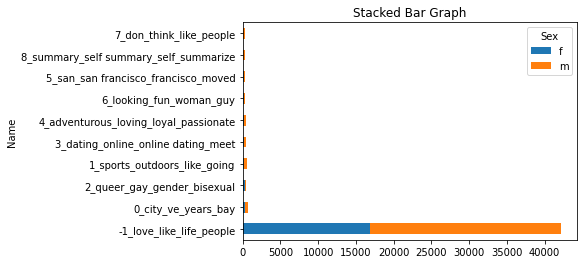

In [43]:
top10.plot(
    x = 'Name',
    kind = 'barh',
    stacked = True,
    title = 'Stacked Bar Graph',
    mark_right = True)

In [45]:
top20['Name'] = top20.index

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [46]:
top20 = top20[1:]

In [48]:
top20

Sex,f,m,Name
Name,,,
0_city_ve_years_bay,317,375,0_city_ve_years_bay
2_queer_gay_gender_bisexual,276,204,2_queer_gay_gender_bisexual
1_sports_outdoors_like_going,231,331,1_sports_outdoors_like_going
3_dating_online_online dating_meet,199,258,3_dating_online_online dating_meet
4_adventurous_loving_loyal_passionate,189,256,4_adventurous_loving_loyal_passionate
6_looking_fun_woman_guy,151,182,6_looking_fun_woman_guy
5_san_san francisco_francisco_moved,135,203,5_san_san francisco_francisco_moved
8_summary_self summary_self_summarize,115,171,8_summary_self summary_self_summarize
7_don_think_like_people,108,189,7_don_think_like_people


In [54]:
df_total = top20["f"] + top20["m"]
df_rel = top20[top20.columns[0:2]].div(df_total, 0)*100

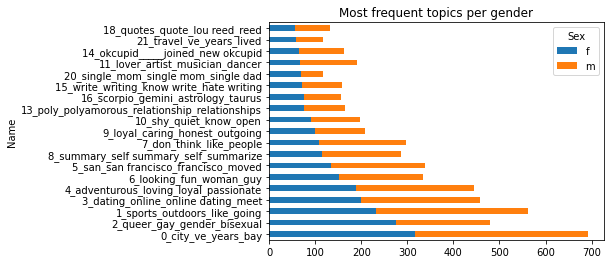

In [59]:
top20.plot(
    x = 'Name',
    kind = 'barh',
    stacked = True,
    title = 'Most frequent topics per gender',
    mark_right = True)